## Processing single-cell RNA-sequencing

#### Introduction
   For this asignment I picked a dataset from paper Ordovas-Montanes, J., Dwyer, D.F., Nyquist, S.K. et al. Allergic inflammatory memory in human respiratory epithelial progenitor cells. Nature 560, 649–654 (2018). https://doi.org/10.1038/s41586-018-0449-8.
    The health problem sutdied in this paper is chronic rhinosinusitis in humans and is characterized by barrier tissue disfunction which ranges from rhinitis to severe nasal polyps.What is already known at the cell level, is that the basal stem cells diferentiate in specific subset of epithelial cells which have the purpose to protect the upper airways. The question asked is how are these subset of cells influence the barrier tissue dysfunction as it is known that the increase of basal stem cell type is directly correlated with a more severe disease.
    For this analysis 12 samples from ethmoid sinus were taken from humans that had different diseases severity.The dataset was separated in two: 6 samples with polyps and 6 without polyp(polyps indicate a high severity and no polyps indicate low severity). To profile this tissue Seq-Well was used for single-cell RNA sequencing.

#### About the dataset
   The dataset used is named SuppTable2_PolypALL_merged.txt and some useful metadata SuppTable9_R_SingleCell_MetaData.xlsx. File SuppTable2_PolypALL_merged.txt contains the counts matrix that was generated after read alignment and all samples were merged in one file, filetring out cells with UMMI<500. This is the file with which we will start the data processing.
   This file can be downloaded from the section Supplementary information of the paper, category Supplementary Tables which contains an archive with all the datasets and suplimentary files. One of the files is SuppTable2_PolypALL_merged.txt

Setting up the working directory for R

In [3]:
setwd(path.expand("~/data/jupyternotebooks/Assignment1StanciuMariaAlexandra/dataset"))
getwd()

[1] "/mnt/storage/r0776676/jupyternotebooks/Assignment1StanciuMariaAlexandra/dataset"

Loading the needed libraries:

In [4]:
options(stringsAsFactors=FALSE)

library(Seurat)
library(dplyr)
library(Matrix)
library(SCopeLoomR)
library(IRdisplay)
library(plyr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘SCopeLoomR’


The following object is masked from ‘package:base’:

    flush


------------------------------------------------------------------------------

You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)

------------------------------------------------------------------------------


Attaching package: ‘plyr’


The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize




The data from ethmoid sinus extracted by surgery; nr of patients is 12 of which 6 
are polyp and 6 are non-polyp and they all have chronic rhinosinusitis,which ranges in severity from rhinitis
to severe nasal polyps. This file has as columns the different conditions and the rows have the genes.

In [5]:
rawfile <- 'SuppTable2_PolypALL_merged.txt'
rawcounts <- read.table(rawfile, header=1, row.names=1)

In [6]:
dim(rawcounts)

[1] 31032 19196

In [7]:
#Just to take a look at how the matrix looks like
rawcounts[1:5,1:5]

,Polyp1TOT_1,Polyp1TOT_2,Polyp1TOT_3,Polyp1TOT_4,Polyp1TOT_5
,<int>,<int>,<int>,<int>,<int>
A1BG,0,0,0,0,0
A1BG-AS1,0,0,0,0,0
A1CF,0,0,0,0,0
A2M,14,0,0,0,0
A2M-AS1,0,0,0,0,0


In [8]:
#Creating Seurat object
ethSinus_seurat_obj <- CreateSeuratObject(rawcounts, min.cells = 5, min.features = 300)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [9]:
#check seurat object
ethSinus_seurat_obj

An object of class Seurat 
22577 features across 18635 samples within 1 assay 
Active assay: RNA (22577 features, 0 variable features)

Add metadata to to my Seurat object, more specifically we add a new column to the metadata already created with the Seurat object.A new column,named "polyp"  which can take values "YES" for having polyp or "NO" otherwise.
This information can be found in SuppTable9_R_SingleCell_MetaData.xlsx file. 

In [10]:
#add metadata to my Seurat object
ethSinus_seurat_obj <- AddMetaData(ethSinus_seurat_obj, NA, col.name = 'polyp')
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp1TOT'] <- 'YES'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp2TOT'] <- 'YES'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp3TOT'] <- 'NO'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp4TOT'] <- 'YES'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp5TOT'] <- 'NO'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp6ATOT'] <- 'NO'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp6BTOT'] <- 'NO'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp7TOT'] <- 'NO'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp8TOT'] <- 'NO'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp9TOT'] <- 'YES'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp11TOT'] <- 'YES'
ethSinus_seurat_obj@meta.data$polyp[ethSinus_seurat_obj@meta.data$orig.ident == 'Polyp12TOT'] <- 'YES'

In [11]:
#check how my Seurat object looks now
head(ethSinus_seurat_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,polyp
,<fct>,<dbl>,<int>,<chr>
Polyp1TOT_1,Polyp1TOT,9809,3125,YES
Polyp1TOT_2,Polyp1TOT,9063,2914,YES
Polyp1TOT_3,Polyp1TOT,8281,2507,YES
Polyp1TOT_4,Polyp1TOT,10002,3615,YES
Polyp1TOT_5,Polyp1TOT,7995,2815,YES
Polyp1TOT_6,Polyp1TOT,7927,1531,YES


### Quality control & Filtering


There are two aspects to be check at these stage regarding quality: the outlier genes that can come from technical errors and checking the mithocondrial gene procentage.

First quality check is to see if there any doublets in the data and this is already calculated by the Seurat object and filled in two columns nFeature_RNA and nCount_RNA that are showing if there are any potential outlier number of genes.

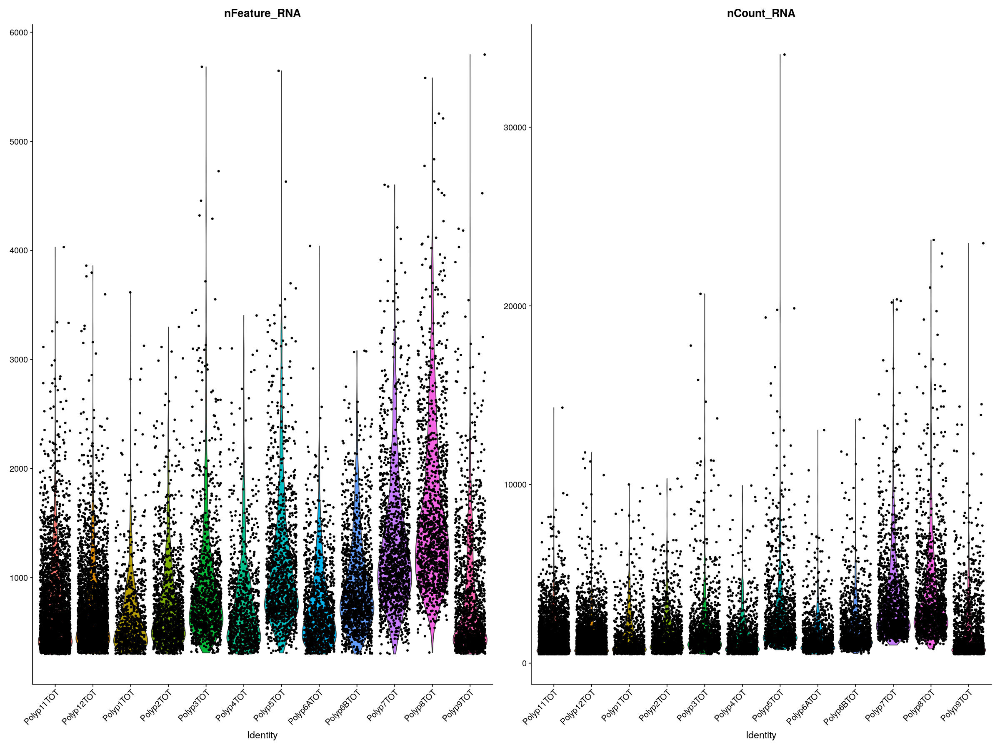

In [12]:
options(repr.plot.width=20, repr.plot.height=15) # To set the figure size
VlnPlot(object = ethSinus_seurat_obj, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2)

In [13]:
summary(ethSinus_seurat_obj@meta.data$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  297.0   504.0   742.0   906.7  1125.0  5795.0 

In [14]:
summary(ethSinus_seurat_obj@meta.data$nCount_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  500.0   888.5  1436.0  2016.9  2432.0 34069.0 

We can also visualize these metrics in relation to our covariate: "polyp" 

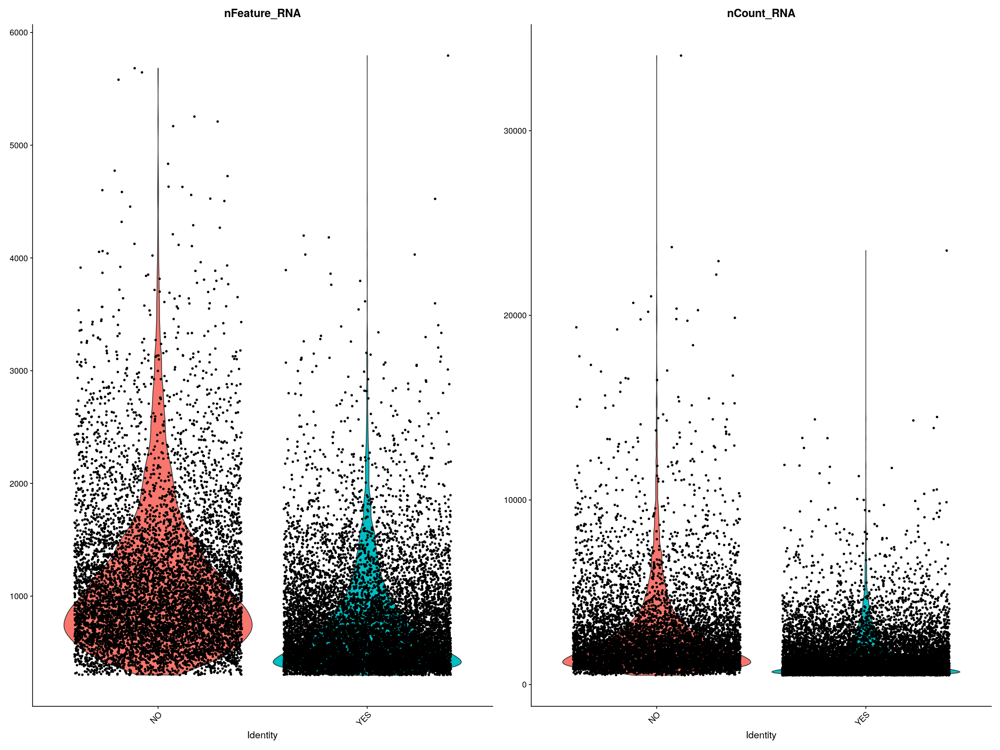

In [15]:
options(repr.plot.width=20, repr.plot.height=15)
VlnPlot(object = ethSinus_seurat_obj, features = c("nFeature_RNA", "nCount_RNA"), ncol = 2, group.by = "polyp")

I am not sure if I will still filter out based on UMI, as it is already filtered with UMI<500, but maybe an upper bound is needed as well. I will use FeatureScatter to see if I can identifying cells with high number of genes or UMIs more easily.

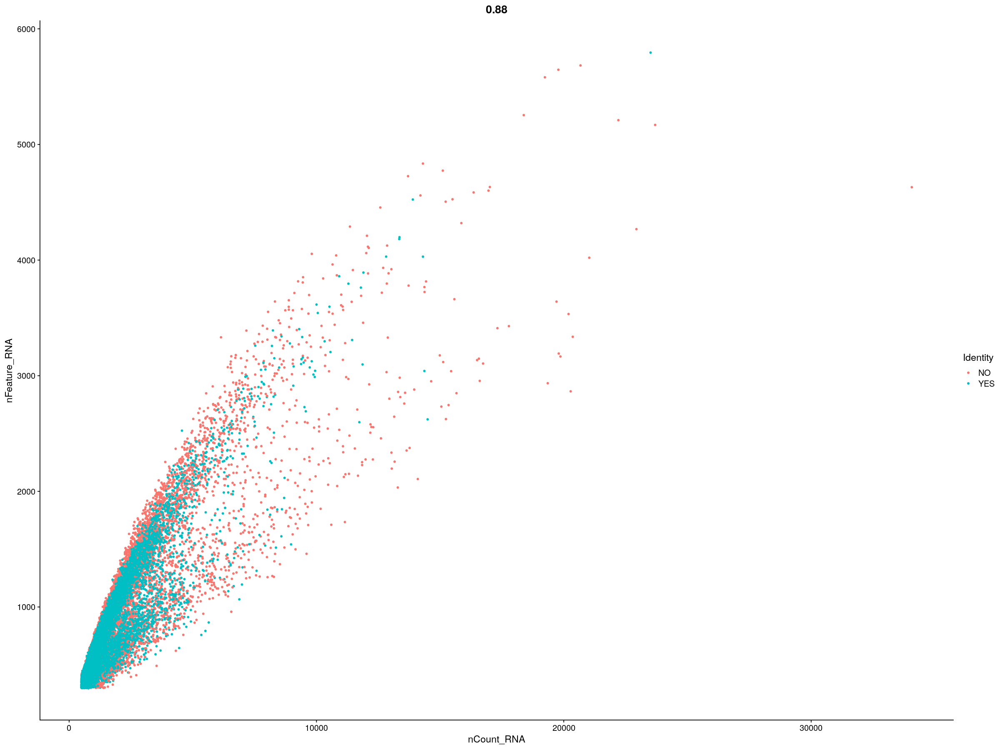

In [16]:
options(repr.plot.width=20, repr.plot.height=15)
FeatureScatter(object = ethSinus_seurat_obj, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "polyp")

From this plot I clearly see the lower bound nFuture_RNA at 500 and I would filter out the ones with nCount_RNA<10000.

In [17]:
ethSinus_seurat_obj <- subset(ethSinus_seurat_obj, subset = nCount_RNA <= 10000)
ethSinus_seurat_obj

An object of class Seurat 
22577 features across 18478 samples within 1 assay 
Active assay: RNA (22577 features, 0 variable features)

There are 22577 features left across 18478 samples and we had 22577 features across 18635 samples,so we decreased the number of cells from 18478 to 18635; we didn't loose so much.

Next check is to see the mitochondria genes for each cell and to do this, this information has to be added to seurat object.

In [18]:
ethSinus_seurat_obj[["percent.mt"]] <- PercentageFeatureSet(ethSinus_seurat_obj, pattern = "^MT-")

In [19]:
#check the new column added to the metadata tab
head(ethSinus_seurat_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,polyp,percent.mt
,<fct>,<dbl>,<int>,<chr>,<dbl>
Polyp1TOT_1,Polyp1TOT,9809,3125,YES,1.2947293
Polyp1TOT_2,Polyp1TOT,9063,2914,YES,2.9129427
Polyp1TOT_3,Polyp1TOT,8281,2507,YES,6.4605724
Polyp1TOT_5,Polyp1TOT,7995,2815,YES,1.6885553
Polyp1TOT_6,Polyp1TOT,7927,1531,YES,0.9209032
Polyp1TOT_7,Polyp1TOT,6046,2128,YES,2.2825008


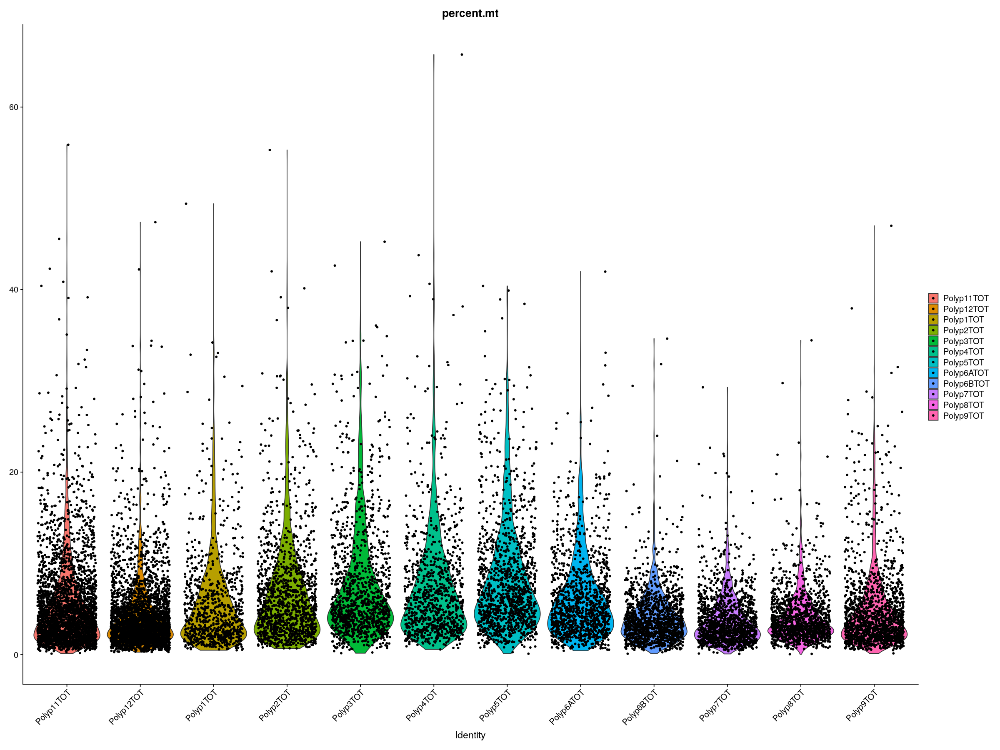

In [20]:
#Violin plot for different conditions versus precent.mt column
options(repr.plot.width=20, repr.plot.height=15)
VlnPlot(ethSinus_seurat_obj, features = c("percent.mt"))

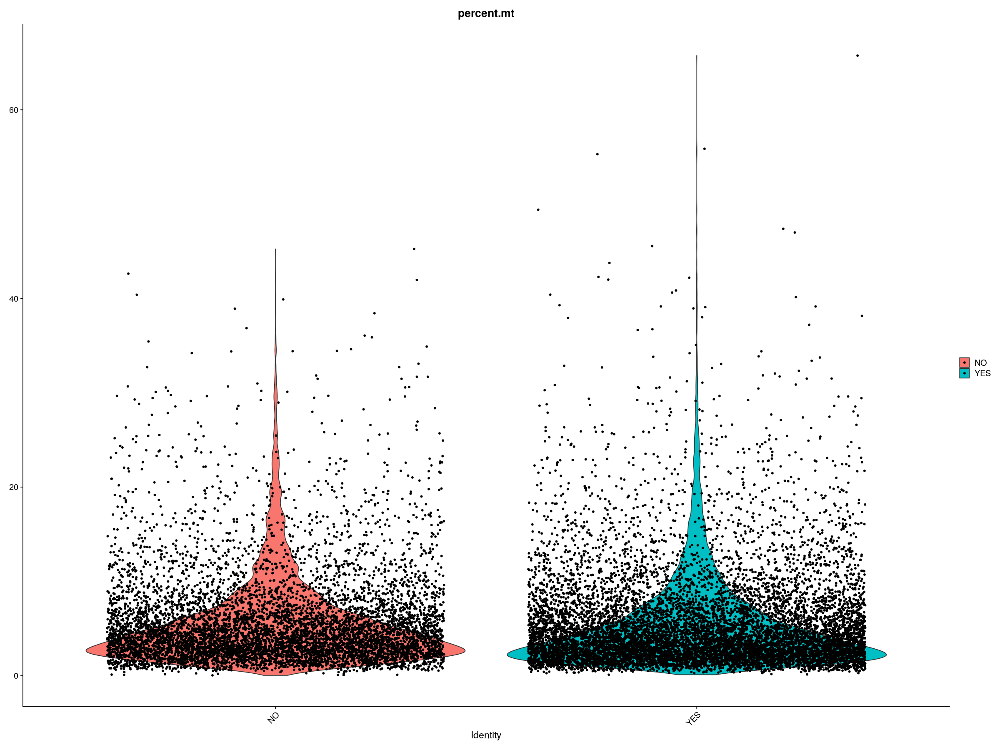

In [21]:
#Violin plot for polyp or non-polyp condition versus precent.mt column
options(repr.plot.width=20, repr.plot.height=15) 
VlnPlot(ethSinus_seurat_obj, features = c("percent.mt"), group.by = "polyp")

I wouldn't filter by mitochondrial genes as I can observe that for non-polyp samples these procetange is not 
more than 40% at most and in case of polyp there are a few outliers, but we don't know for sure if is technical bias
or it has biological meaning.If it looks that it impacts the analysis I can remove it in the following steps.

Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


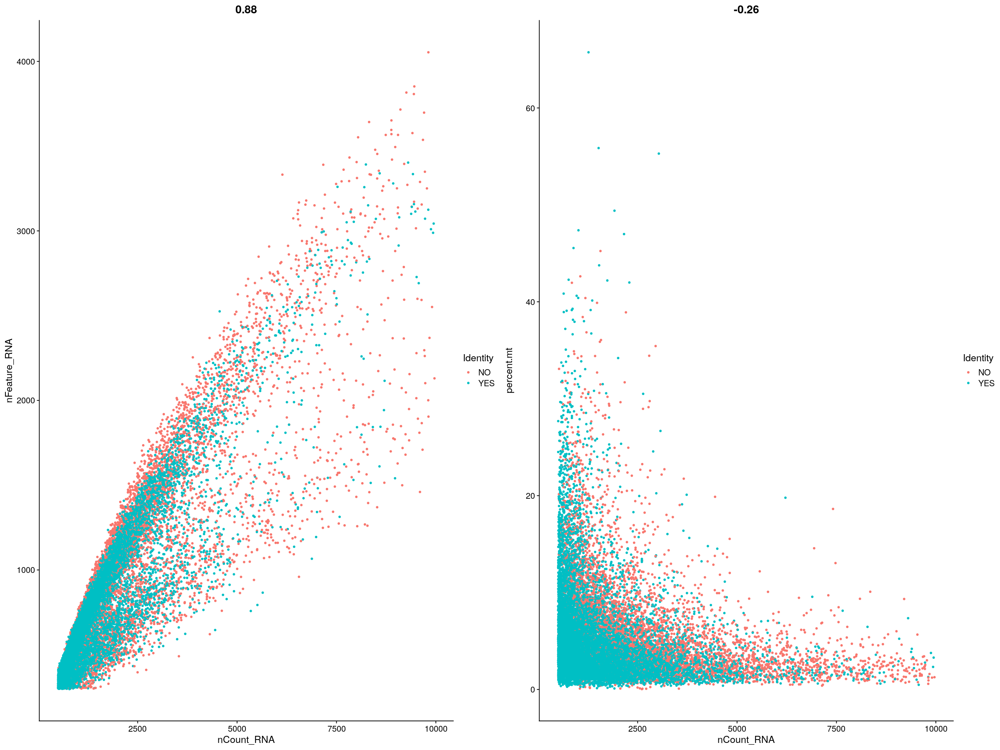

In [22]:
#let's take a look at how the data looks now
options(repr.plot.width=20, repr.plot.height=15)
plot1 <- FeatureScatter(object = ethSinus_seurat_obj, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "polyp")
plot2 <- FeatureScatter(object = ethSinus_seurat_obj, feature1 = "nCount_RNA", feature2 = "percent.mt", group.by = "polyp")

CombinePlots(plots = list(plot1, plot2))

Regarding UMI plot, I can still see a value for Feature a bit far away from the others,but I will leave it like this for now. The mt precentage has also some outliers for polyp= "Yes" group, but I will keep it as it is as well(the one very far with >50% mabybe should be removed).

### Normalization
 
After the quality checks the data ha to be normalized and Seurat has a method for this called "LogNormalize".
the normalize data is ethSinus_seurat_obj[["RNA"]]@data and can be accesed by ethSinus_seurat_obj[["RNA"]]@data.
The original data is kept in ethSinus_seurat_obj[["RNA"]]@counts.

In [23]:
ethSinus_seurat_obj <- NormalizeData(object = ethSinus_seurat_obj, normalization.method = "LogNormalize")

In [24]:
#normalized data
GetAssayData(ethSinus_seurat_obj, slot="data")[1:5,1:5]

5 x 5 sparse Matrix of class "dgCMatrix"
         Polyp1TOT_1 Polyp1TOT_2 Polyp1TOT_3 Polyp1TOT_5 Polyp1TOT_6
A1BG        .                  .           .           .   .        
A1BG-AS1    .                  .           .           .   .        
A2M         2.726061           .           .           .   0.8160333
A2M-AS1     .                  .           .           .   .        
A2ML1       .                  .           .           .   .        

In [25]:
#original data
GetAssayData(ethSinus_seurat_obj, slot="counts")[1:5,1:5]

5 x 5 sparse Matrix of class "dgCMatrix"
         Polyp1TOT_1 Polyp1TOT_2 Polyp1TOT_3 Polyp1TOT_5 Polyp1TOT_6
A1BG               .           .           .           .           .
A1BG-AS1           .           .           .           .           .
A2M               14           .           .           .           1
A2M-AS1            .           .           .           .           .
A2ML1              .           .           .           .           .

### Find variable genes

After the quality control and normalization, next step is to identify the genes that are most  variable in the dataset meaning that we are looking for cells that are highly expressed in some cells and low expressed in other cells. This strategy will help with further in the analysis because like this we can avoid including many genes that are not informative in the method used for dimension reduction, like PCA and focus on the most informative ones. This can be done using FindVariableFeatures() function. This function returns,by default, 2000 most variable genes from the dataset and these genes will be on the following analysis.

In [26]:
ethSinus_seurat_obj <- FindVariableFeatures(ethSinus_seurat_obj)

[1] "IGHM"     "IGKV4-1"  "IGLV6-57" "PRB3"     "IGHD"     "IGLV2-14"
 [7] "IGLC7"    "IGLL5"    "IGLV3-21" "PRB1"     "IGLV1-44" "IGHV1-69"
[13] "IGHV3-15" "IGHV1-24" "IGHV3-21" "IGKV1-5"  "IGLV2-23" "IGLV3-1" 
[19] "IGKV3-11" "IGLJ3"    "IGLV3-25" "IGLC2"    "IGHV3-23" "IGLV2-11"
[25] "IGKJ4"    "IGKV3-15" "IGLJ2"    "IGKV1-9"  "IGLV2-8"  "IGKJ3"   
[31] "IGLV1-40" "IGLC3"    "IGKV1D-8" "PRB4"     "IGLV1-47" "IGHV1-2" 
[37] "IGHV1-18" "IGKV1-27" "IGLV3-16" "D86994.2" "IGHV3-48" "IGLL1"   
[43] "IGHV3-74" "IGHV3-30" "IGKV1-17" "IGHV3-43" "IGHV3-7"  "MSMB"    
[49] "IGLV1-51" "IGKJ5"

When using repel, set xnudge and ynudge to 0 for optimal results



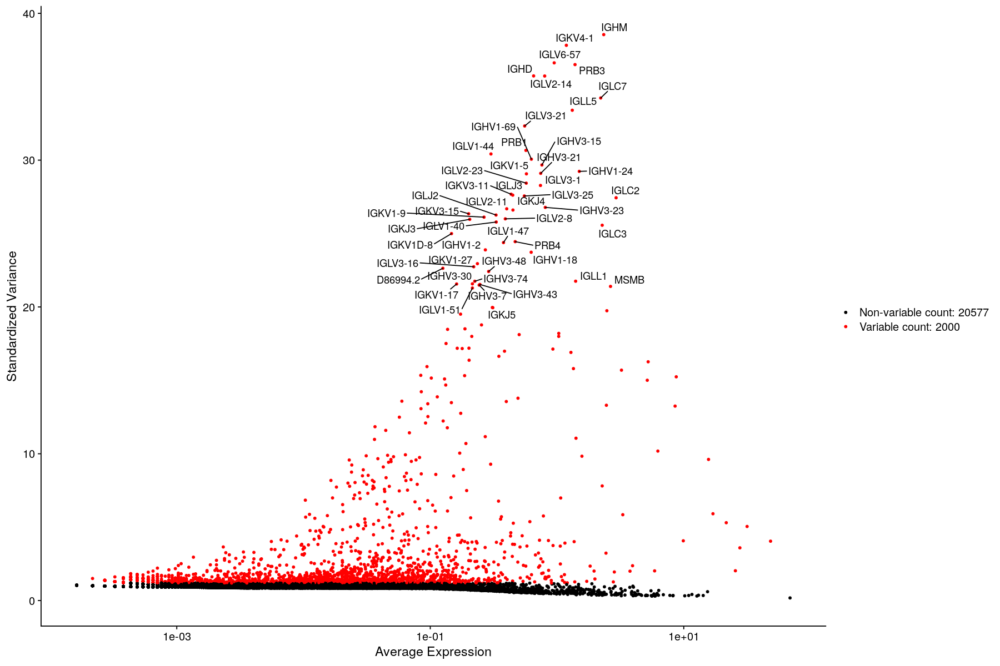

In [27]:
# Save in a variable 'top50' the first 50 most variable genes 
top50 <- head(VariableFeatures(ethSinus_seurat_obj), 50)
top50

# plot variable features
options(repr.plot.width=15, repr.plot.height=10)
plot1 <- VariableFeaturePlot(ethSinus_seurat_obj)
plot2 <- LabelPoints(plot=plot1, points=top50, repel = TRUE,xnudge=0)
plot2

### Scaling the data

Next, we apply a linear transformation (‘scaling’) that is a standard pre-processing step prior to dimensional reduction techniques like PCA. The ScaleData function:

    Shifts the expression of each gene, so that the mean expression across cells is 0
    Scales the expression of each gene, so that the variance across cells is 1.

This step gives equal weight in downstream analyses, so that highly-expressed genes do not dominate.


In [28]:
all.genes <- rownames(ethSinus_seurat_obj)
ethSinus_seurat_obj <- ScaleData(ethSinus_seurat_obj, features = all.genes)

Centering and scaling data matrix



In [29]:
# ethSinus_seurat_obj[["RNA"]]@scale.data[1:5,1:5]
GetAssayData(ethSinus_seurat_obj, slot="scale.data")[1:5,1:5]

,Polyp1TOT_1,Polyp1TOT_2,Polyp1TOT_3,Polyp1TOT_5,Polyp1TOT_6
A1BG,-0.01871976,-0.01871976,-0.01871976,-0.01871976,-0.01871976
A1BG-AS1,-0.05765618,-0.05765618,-0.05765618,-0.05765618,-0.05765618
A2M,3.18371419,-0.32532130,-0.32532130,-0.32532130,0.72509174
A2M-AS1,-0.04133615,-0.04133615,-0.04133615,-0.04133615,-0.04133615
A2ML1,-0.02993781,-0.02993781,-0.02993781,-0.02993781,-0.02993781


### Dimensionality reduction & clustering

Next step in the processing sc RNA-seq is to do dimension reduction on the most variable genes,scaled and centered, that we have found at the previous step. So, we are going to use PCA to do dimension reduction on the 2000 most variable genes which is going to reveal the presence of clusters, if there are any.
PCA is a method which does dimenision reduction by capturing most of the variability on fewer fetures.
Here RunPCA() function is used.

In [30]:
ethSinus_seurat_obj <- RunPCA(ethSinus_seurat_obj, ndims.print = 1:10, nfeatures.print = 10)

PC_ 1 
Positive:  SNTN, C20orf85, C9orf24, PIFO, TPPP3, CAPSL, FAM183A, OMG, TMEM190, RSPH1 
Negative:  IGJ, SRGN, POSTN, IGHA1, VIM, LGALS1, IGHG4, RGS1, MZB1, IGHA2 
PC_ 2 
Positive:  SLPI, WFDC2, PIGR, AGR2, SERPINB3, CLDN4, BPIFB1, KRT8, AQP3, KRT7 
Negative:  DCN, COL1A2, COL3A1, LUM, MGP, SPARC, CALD1, CPE, FBLN1, COL1A1 
PC_ 3 
Positive:  SRGN, RGS1, AIF1, TYROBP, GPR183, FGL2, HLA-DPA1, HLA-DPB1, MS4A6A, IGJ 
Negative:  SLPI, WFDC2, PIGR, AGR2, KRT8, AQP3, BPIFB1, CLDN4, SERPINB3, KRT7 
PC_ 4 
Positive:  MZB1, IGJ, ENAM, DERL3, IGHG2, IGHG1, AC096579.7, IGHA1, FKBP11, IGHG3 
Negative:  AIF1, HLA-DRA, HLA-DRB1, HLA-DQA1, HLA-DRB5, HLA-DPB1, MS4A6A, HLA-DPA1, CST3, TYROBP 
PC_ 5 
Positive:  AZGP1, LTF, C6orf58, ZG16B, DMBT1, TCN1, PIP, STATH, ODAM, RNASE1 
Negative:  SERPINB3, ALOX15, S100A2, SERPINB4, AQP3, KRT5, MT1X, ALDH3A1, POSTN, SFN 
PC_ 6 
Positive:  SPARCL1, ELTD1, EMCN, CLDN5, DARC, ECSCR, PLVAP, VWF, RAMP2, ESAM 
Negative:  AZGP1, LYZ, TCN1, LTF, C6orf58, ZG16B, DMBT1,

In [31]:
#check which genes have been included in PCA
print(ethSinus_seurat_obj[["pca"]], dims = 1:10, nfeatures = 10)

PC_ 1 
Positive:  SNTN, C20orf85, C9orf24, PIFO, TPPP3, CAPSL, FAM183A, OMG, TMEM190, RSPH1 
Negative:  IGJ, SRGN, POSTN, IGHA1, VIM, LGALS1, IGHG4, RGS1, MZB1, IGHA2 
PC_ 2 
Positive:  SLPI, WFDC2, PIGR, AGR2, SERPINB3, CLDN4, BPIFB1, KRT8, AQP3, KRT7 
Negative:  DCN, COL1A2, COL3A1, LUM, MGP, SPARC, CALD1, CPE, FBLN1, COL1A1 
PC_ 3 
Positive:  SRGN, RGS1, AIF1, TYROBP, GPR183, FGL2, HLA-DPA1, HLA-DPB1, MS4A6A, IGJ 
Negative:  SLPI, WFDC2, PIGR, AGR2, KRT8, AQP3, BPIFB1, CLDN4, SERPINB3, KRT7 
PC_ 4 
Positive:  MZB1, IGJ, ENAM, DERL3, IGHG2, IGHG1, AC096579.7, IGHA1, FKBP11, IGHG3 
Negative:  AIF1, HLA-DRA, HLA-DRB1, HLA-DQA1, HLA-DRB5, HLA-DPB1, MS4A6A, HLA-DPA1, CST3, TYROBP 
PC_ 5 
Positive:  AZGP1, LTF, C6orf58, ZG16B, DMBT1, TCN1, PIP, STATH, ODAM, RNASE1 
Negative:  SERPINB3, ALOX15, S100A2, SERPINB4, AQP3, KRT5, MT1X, ALDH3A1, POSTN, SFN 
PC_ 6 
Positive:  SPARCL1, ELTD1, EMCN, CLDN5, DARC, ECSCR, PLVAP, VWF, RAMP2, ESAM 
Negative:  AZGP1, LYZ, TCN1, LTF, C6orf58, ZG16B, DMBT1,

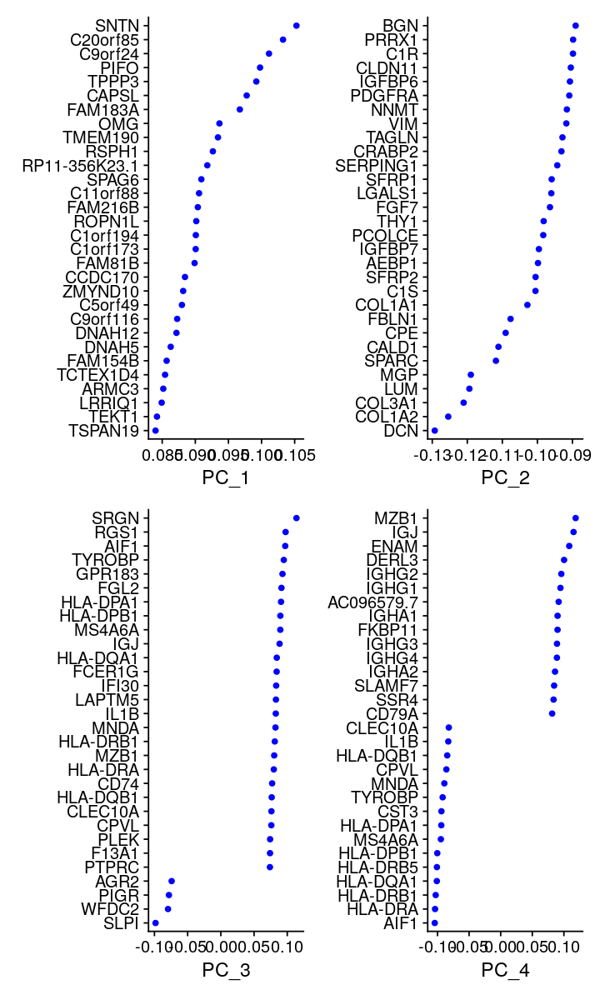

In [32]:
#Top genes for a PC ranked by the scores absolute values: 
options(repr.plot.width=6, repr.plot.height=10)
VizDimLoadings(ethSinus_seurat_obj, dims = 1:4, reduction = "pca")

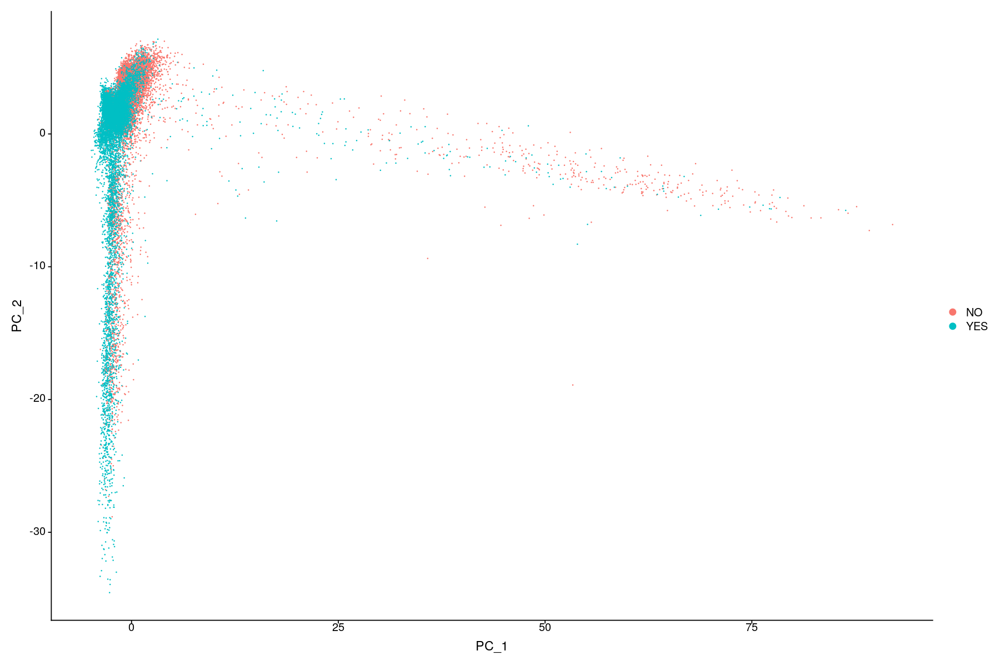

In [33]:
#Use DimPlot to plot the cells on the first two PC axes:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(ethSinus_seurat_obj, reduction = "pca", group.by = "polyp")

From the first two principal components we cannot identify clearly clusters, the variability on PCA1 is quite high but very sparse and on PCA2 it looks as well high, but a more dense. Here we can see the colors as being gathered but they are not separated and maybe these was expected since all the samples where from unhealthy tissue and describes different range of the disease, so here maybe a gradient would me appropiate.

Now, the number of PCA components has to be decided and the purpose is to have as many PCA as to keep almost all the information from the dataset. For this reason we will use a method called elbow-method which will give us a threshold at which addinf more PCAs will not be an information gain. 

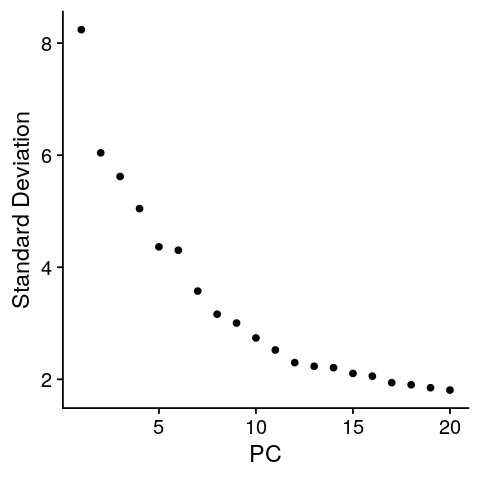

In [52]:
#I would take first 18 PC cg with this graph
options(repr.plot.width=4, repr.plot.height=4)
ElbowPlot(object = ethSinus_seurat_obj)

Looking at this plot it seems that choosing the first 17 PCAs will capture most of the variability in the dataset.
To further apply the clustering algorithms, the PCAs will be used, as they can be considered meta-genes:they have almost all the information, but kept in less features.

Here I use function FindNeighbors() and FindClusters to cluster the dataset based on the PCAs identified and choosing the resolution of the clustering 0.5 after many tries.

In [53]:
ethSinus_seurat_obj <- FindNeighbors(ethSinus_seurat_obj, dims = 1:17)
ethSinus_seurat_obj <- FindClusters(ethSinus_seurat_obj, resolution = 0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 18478
Number of edges: 652959

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9317
Number of communities: 18
Elapsed time: 1 seconds


In [54]:
head(ethSinus_seurat_obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,polyp,percent.mt,RNA_snn_res.0.8,seurat_clusters,RNA_snn_res.0.5
,<fct>,<dbl>,<int>,<chr>,<dbl>,<fct>,<fct>,<fct>
Polyp1TOT_1,Polyp1TOT,9809,3125,YES,1.2947293,6,7,7
Polyp1TOT_2,Polyp1TOT,9063,2914,YES,2.9129427,1,3,3
Polyp1TOT_3,Polyp1TOT,8281,2507,YES,6.4605724,1,3,3
Polyp1TOT_5,Polyp1TOT,7995,2815,YES,1.6885553,1,3,3
Polyp1TOT_6,Polyp1TOT,7927,1531,YES,0.9209032,10,11,11
Polyp1TOT_7,Polyp1TOT,6046,2128,YES,2.2825008,1,3,3


There were 20 clusters found and they are added to @meta.data in Seurat object.

### Non-linear dimensionality reduction

Next step is to see how many cells these cluster have and how they relate with each other. So, for that t-SNE or uMAP can be used to identify the cluster based on similarity. The input here will be our 18 principal components.


In [55]:
#tSNE
ethSinus_seurat_obj <- RunTSNE(object = ethSinus_seurat_obj, dims.use = 1:17)
#umap
ethSinus_seurat_obj <- RunUMAP(ethSinus_seurat_obj, dims = 1:17)

10:47:27 UMAP embedding parameters a = 0.9922 b = 1.112

10:47:27 Read 18478 rows and found 17 numeric columns

10:47:27 Using Annoy for neighbor search, n_neighbors = 30

10:47:27 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

10:47:30 Writing NN index file to temp file /tmp/Rtmp2CxIvr/file2214b10cffa

10:47:30 Searching Annoy index using 1 thread, search_k = 3000

10:47:36 Annoy recall = 100%

10:47:37 Commencing smooth kNN distance calibration using 1 thread

10:47:38 Initializing from normalized Laplacian + noise

10:47:39 Commencing optimization for 200 epochs, with 814232 positive edges

10:47:47 Optimization finished



We will see in the first plot the two groups: polyp and non-polyp and in the second plot we will see the clusters formed inside each category. I choose to use UMAP as it is faster and the clusters look better defined.

Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


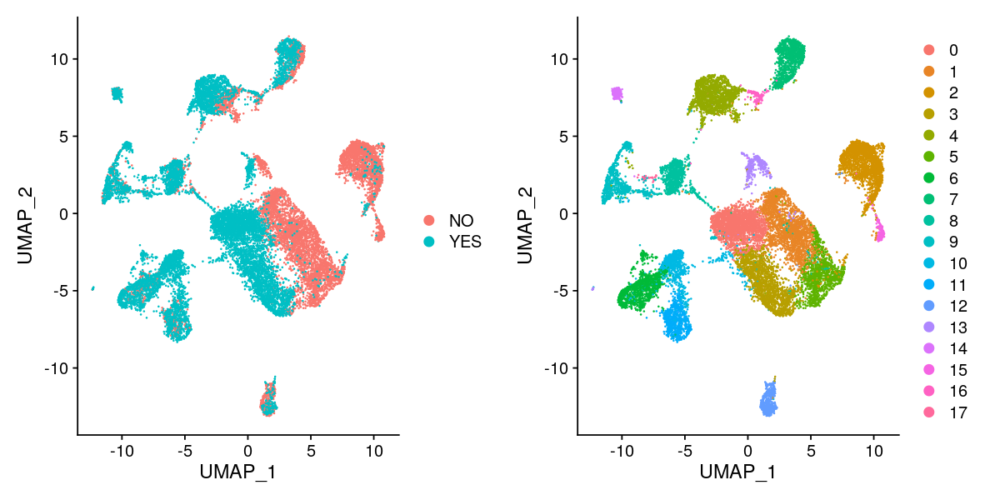

In [56]:
#plot the two conditions: polyp and non-polyp
options(repr.plot.width=10, repr.plot.height=5)
plot1 <- DimPlot(ethSinus_seurat_obj, reduction = "umap", group.by = "polyp")
plot2 <- DimPlot(ethSinus_seurat_obj, reduction = "umap")

#we can observe here that the polyp and non-polyp form themselves different blobs of cells; maybe to much noise?
# they look separated but what we are interested to see are the clusters identified on non-polyp and polyp
plot2 <- DimPlot(ethSinus_seurat_obj, reduction = "umap")
#obvioulsy there are too many clusters here; we could say that green orange, cream,blue is for non-polyp and
# looks that there are a few clusters in the paper as well.
CombinePlots(plots = list(plot1, plot2))
# now we can ask seurat to tell me which genes are different in one cluster from another - marker discovery

Looking at these plots we can say that there is a clear difference between polyp and non-polyp. On tSNE plot is not so clear, but on UMAP, besides some few non-polyp cells, it seems that the polyp one is grouped on the right side and the orange one at left.
From the cluster plots it is difficult to identify the clear clusters. The paper analysing this data set had identified 10 clusters that are defining 10 types of cells.I tried with less stringent settings like creating the Seurat object with at least 300 uniques genes per cell,modifying the UMI filter(leaving in all data or filtering 12000,15000 nCounts),taking less PCAs, for example 12,13 and also many combinations of resolution parameter from FindClusters() function I couldn't arrive to the picture presented in the paper(Fig1.b).I will try to merge part of the clusters by finding marker genes and compare them.

### Marker discovery

Once the clusters are identified, the next step is to try to differentiate these subpopulation by looking at genes that are expressed in some supopulation, but not in other - this is called marker gene.

We can use FindAllMArkers from Seurat based on a likelihood ratio test. So, now we will find genes that are specific for each subpopulation.

In [57]:
#this finds all the clusters compared with the others
ethSinus_markers <- FindAllMarkers(object = ethSinus_seurat_obj, only.pos = TRUE,  test.use = "roc",return.thresh = 0.65)
#save as text:
write.table(ethSinus_markers, file = "ethSinus_markers.txt", sep = "\t", quote = F, col.names = F)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17



Have a look at the top markers for each cluster:
in this table we have the gene, the cluster and some statistics; here we have selected the 2 top markers of each cluster

In [89]:
ethSinus_markers_top1 <- ethSinus_markers%>% group_by(cluster) %>% top_n(n = 1, wt = avg_logFC)
ethSinus_markers_top10 <- ethSinus_markers%>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

ethSinus_markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_logFC)
#checking the genes from the paper, KRT5 appears as highly expressed in cluster0 and cluster 1 
#ethSinus_markers_top10 #[cluster==1]

myAUC,avg_diff,power,avg_logFC,pct.1,pct.2,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.790,1.719067,0.580,1.719067,0.691,0.171,0,KRT15
0.785,2.024008,0.570,2.024008,0.662,0.151,0,MMP10
0.807,1.168655,0.614,1.168655,0.871,0.410,1,AQP3
0.781,1.213225,0.562,1.213225,0.772,0.288,1,EPAS1
0.947,4.163154,0.894,4.163154,0.919,0.154,2,ZG16B
0.946,4.683842,0.892,4.683842,0.941,0.330,2,STATH
0.892,3.178729,0.784,3.178729,0.827,0.098,3,CST1
0.766,2.686367,0.532,2.686367,0.560,0.041,3,CST4
0.975,3.686846,0.950,3.686846,0.961,0.080,4,DCN


Comparing the marker genes in each clusters with the marker genes identified in the paper, it can be observed that for the basal cell for example it is found the marger gene KRT5 as highly expressed in both clusters 0 and 1(cluster 0 falls in polyp category and cluster 1 in non-polyp category).Cluster two is mostly assigned to non-polyp category and the cell type identified by the paper is classified as glandular.

The expression of specific genes can be visualized using `VlnPlot`, `FeaturePlot` and `DoHeatmap`, but I choose FeaturePlot as it seend easier to vizualize the specific marker genes on each cluster. VlnPlot and DoHeatmap looked to crowded and didn't seem o give to much information.

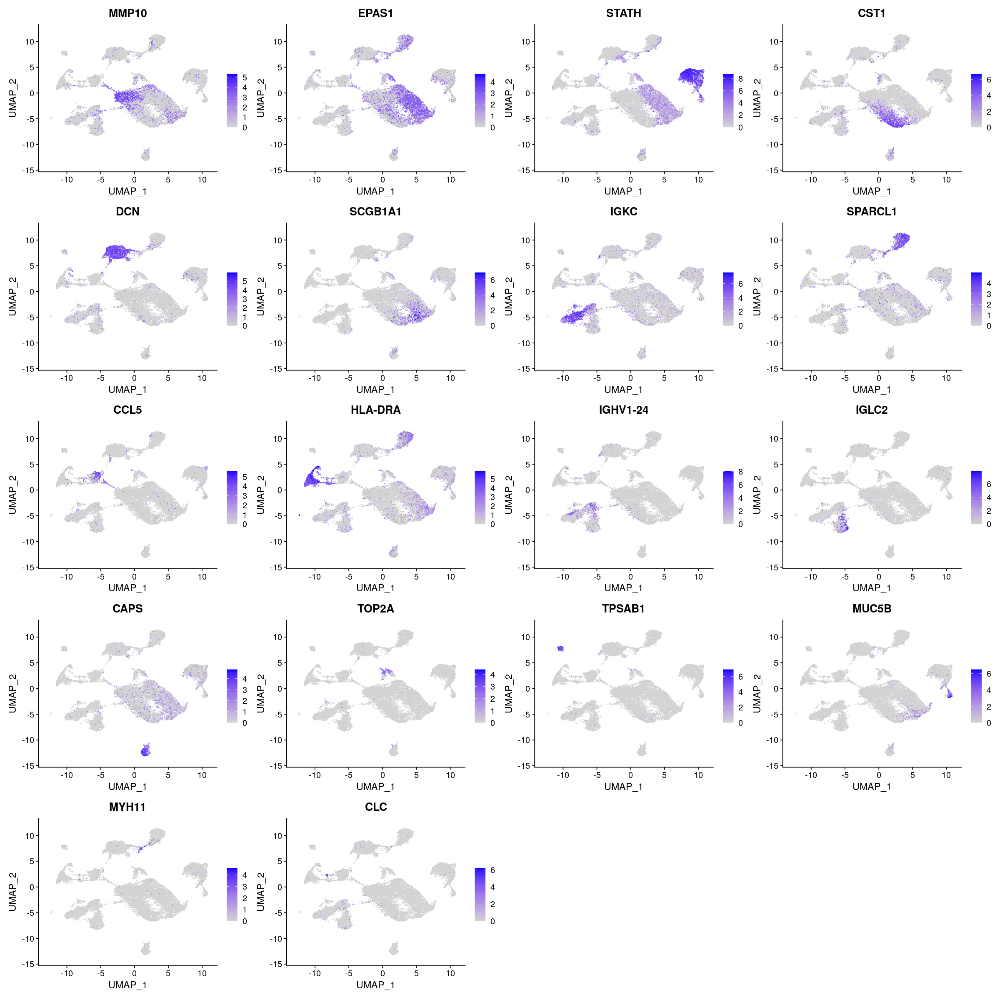

In [63]:
options(repr.plot.width=20, repr.plot.height=20)
FeaturePlot(ethSinus_seurat_obj, features = ethSinus_markers_top1$gene)

Just to identify vizualy the marker genes that are used in the paper I will also plot them with FuturePlot.

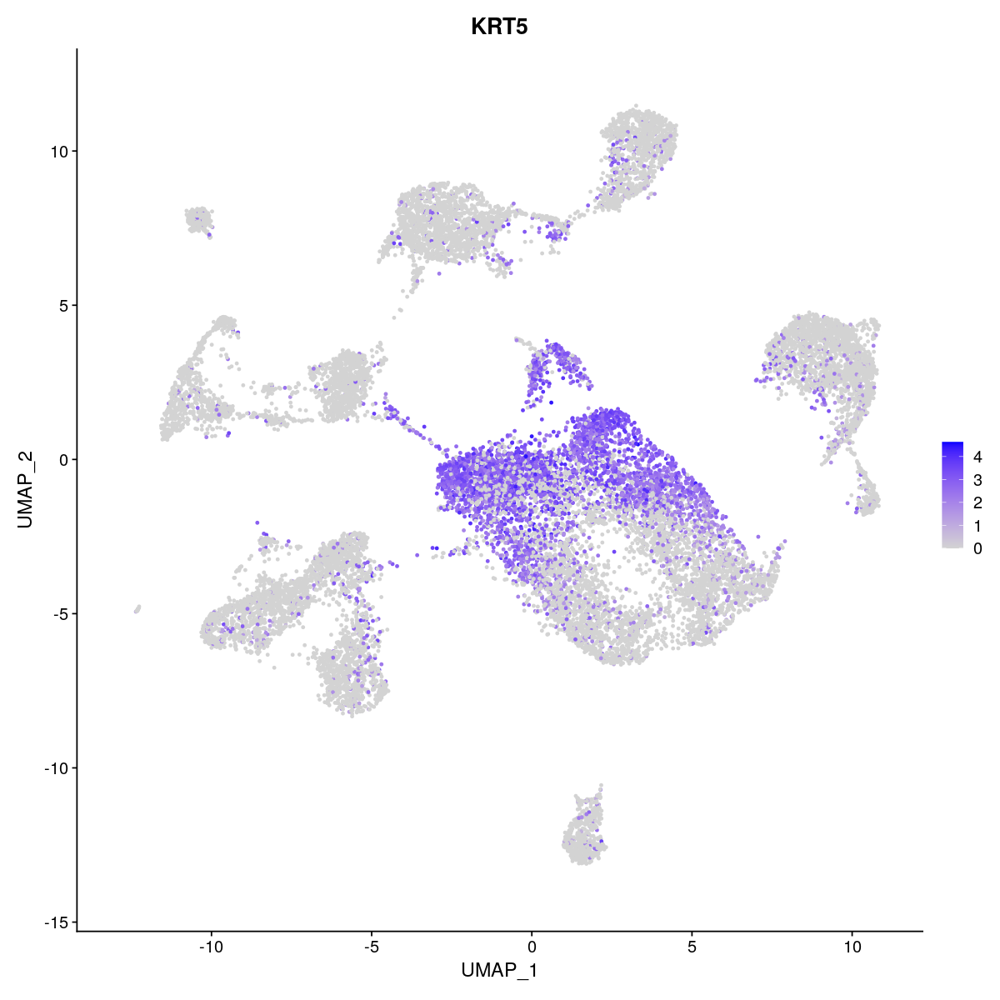

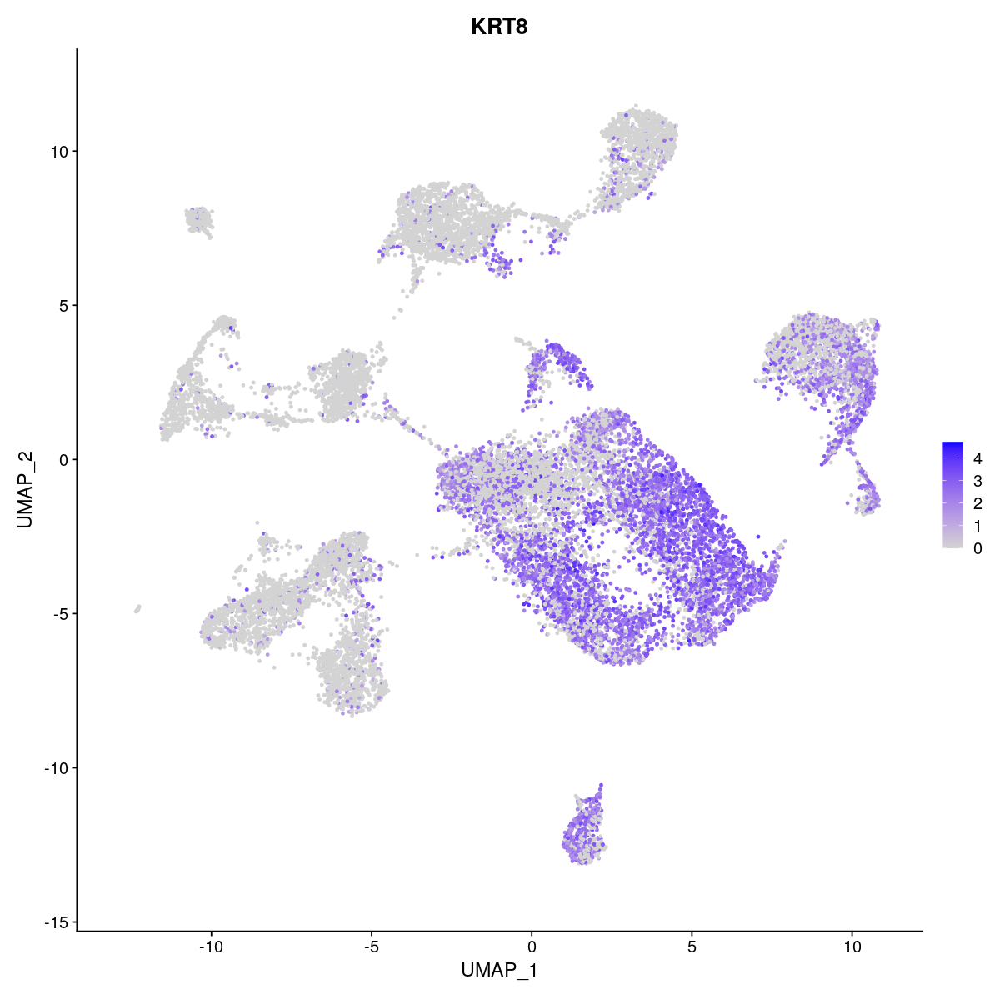

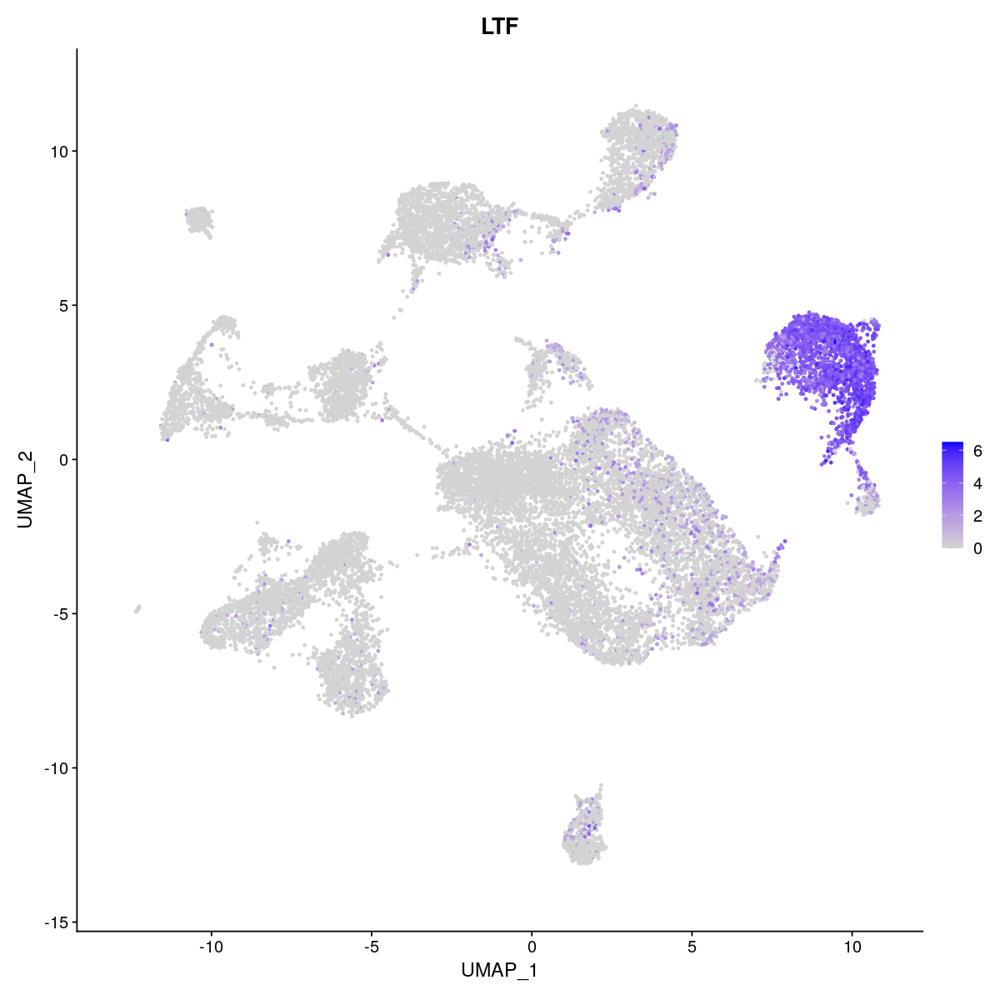

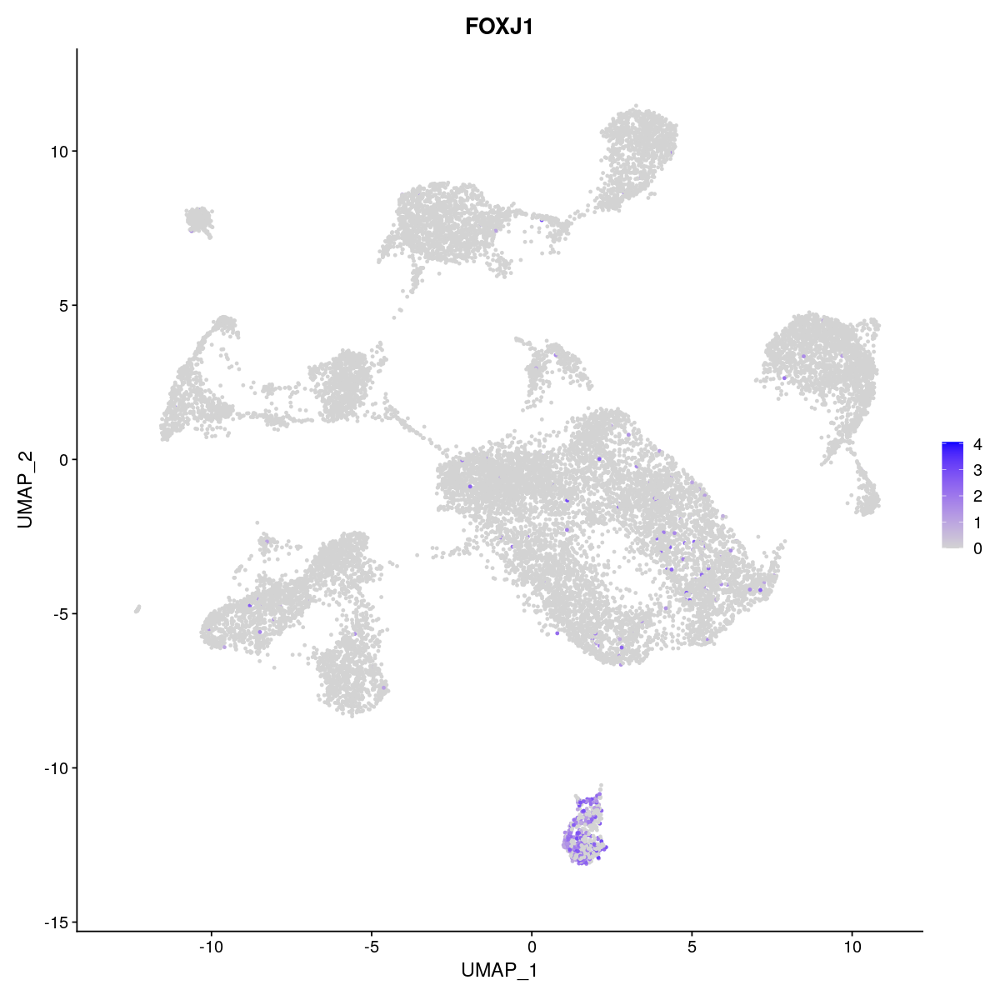

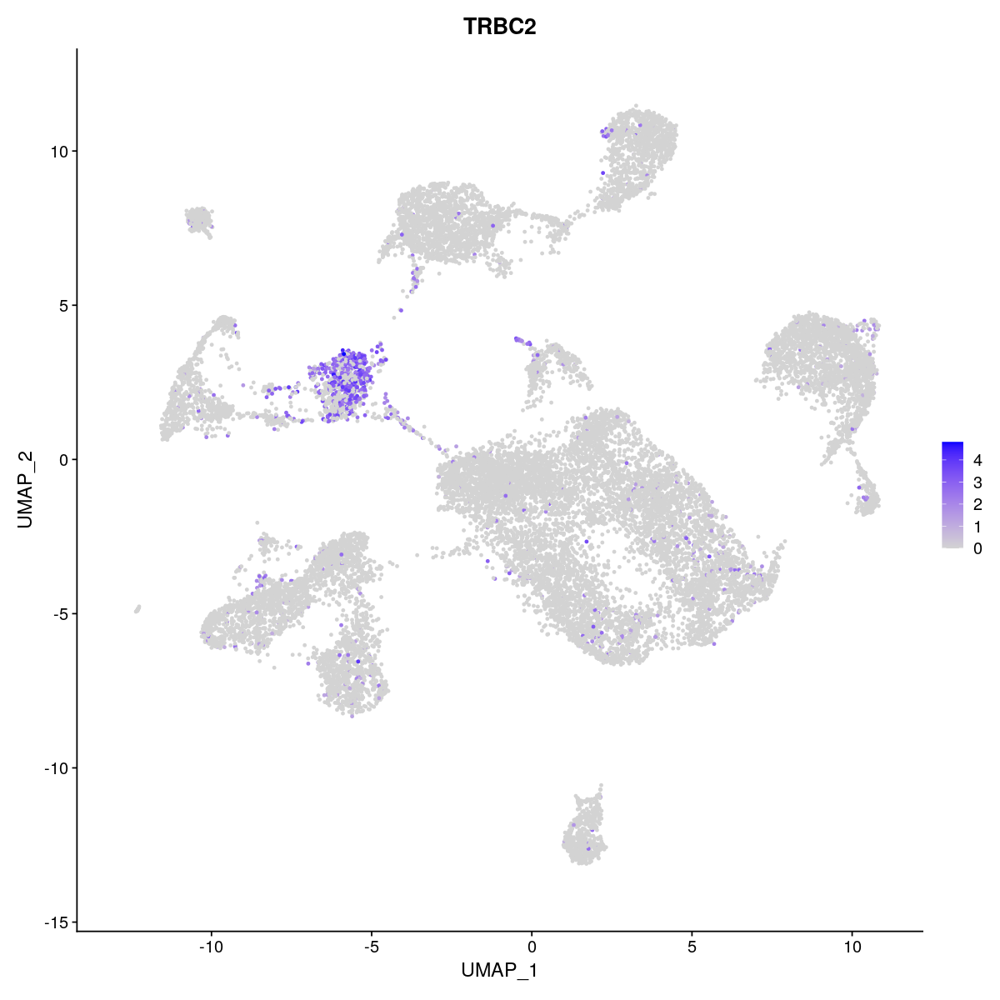

...

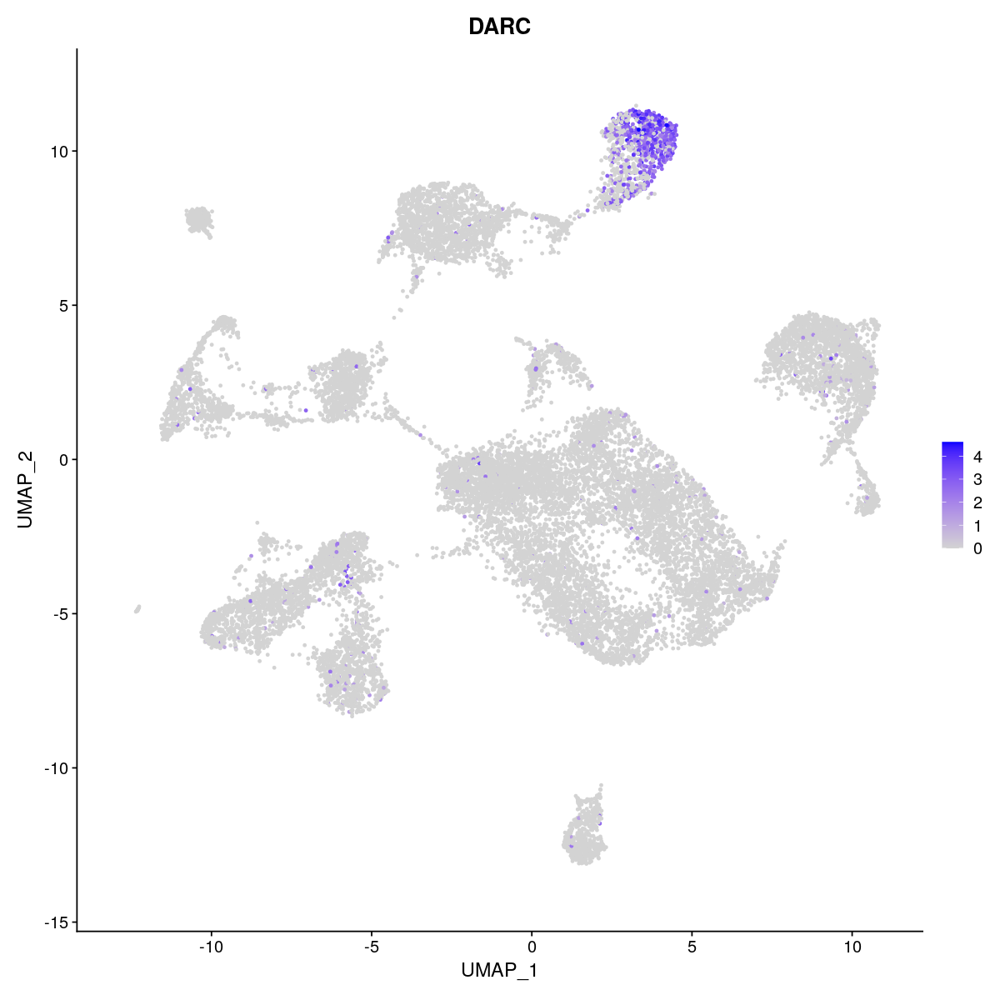

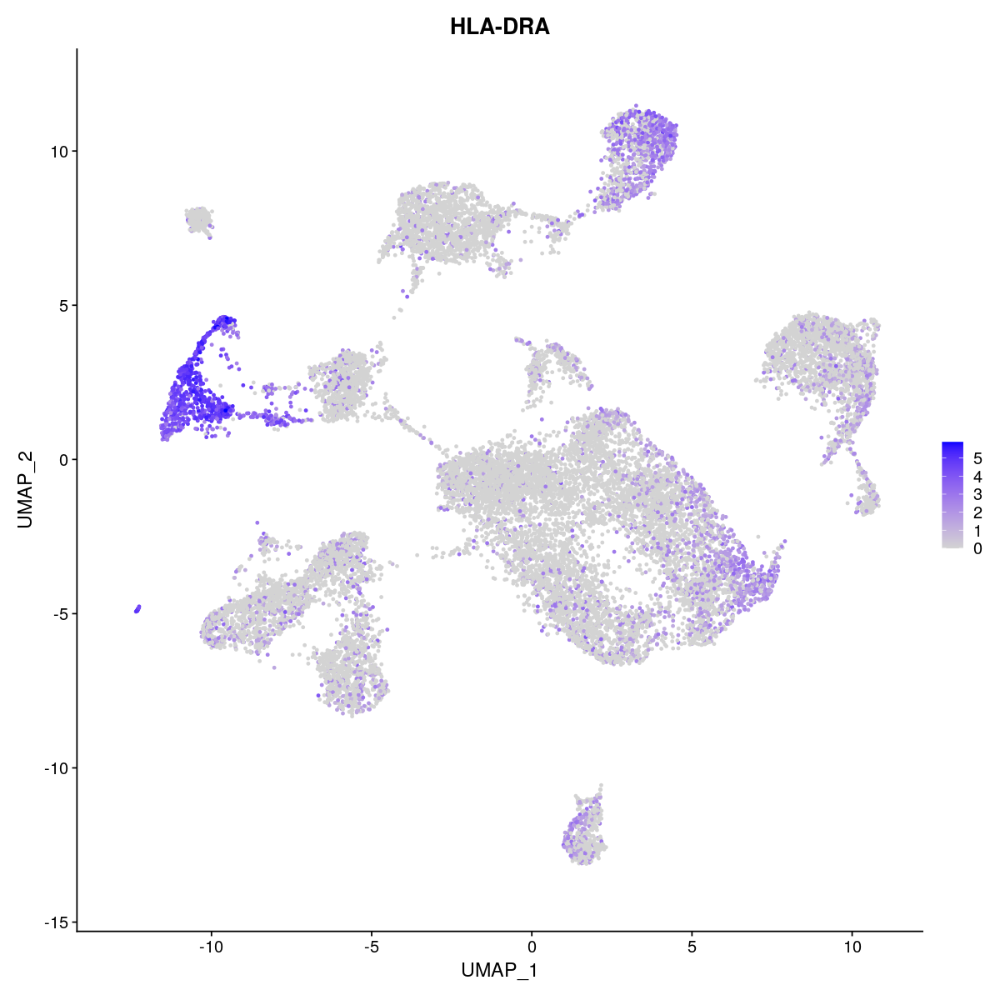

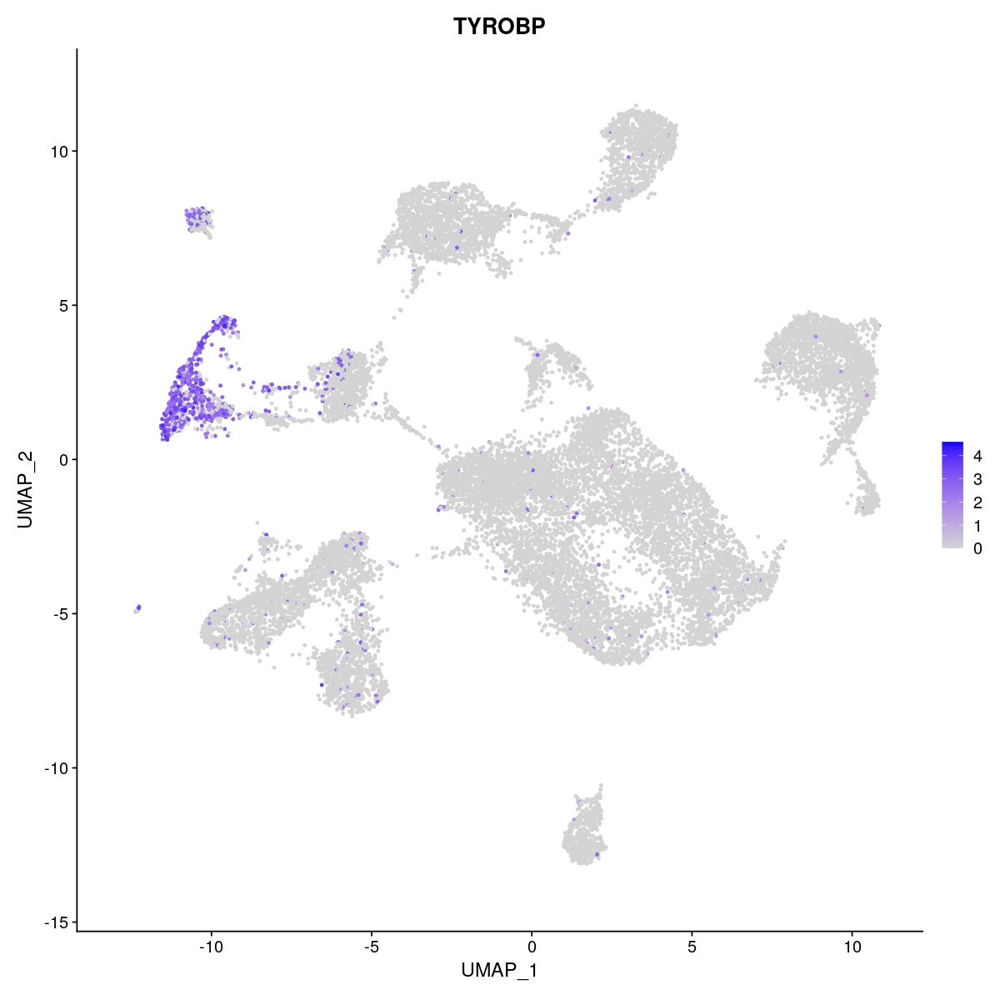

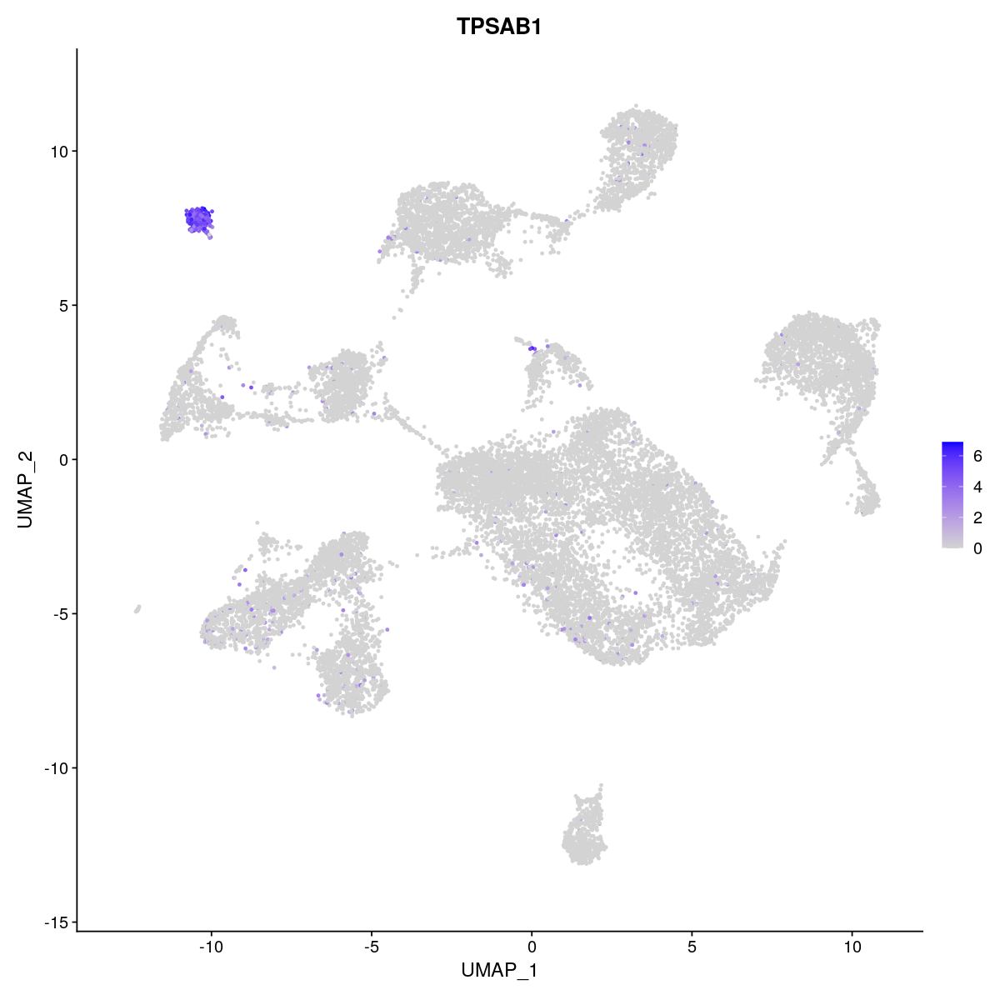

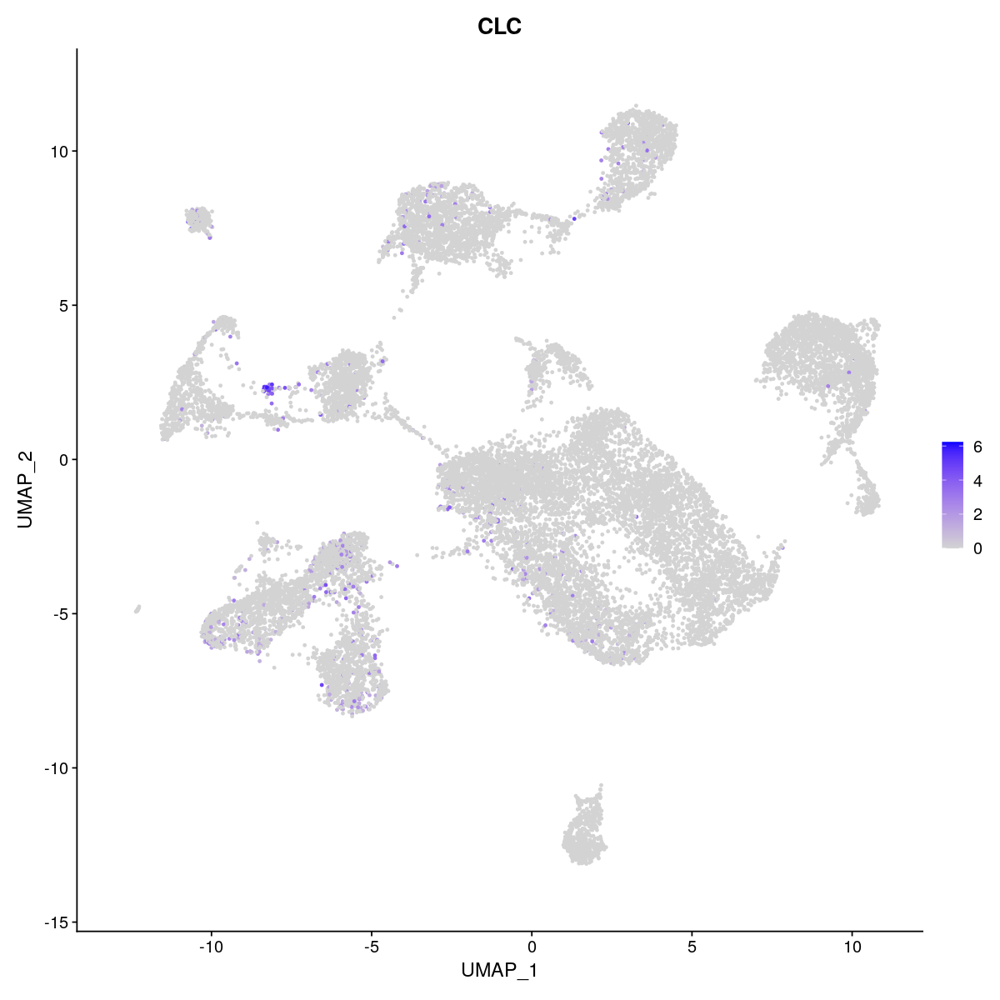

In [66]:
FeaturePlot(ethSinus_seurat_obj, 'KRT5', pt.size = 0.7)
#this plot would suggest that our cluster 0 and 1 do not differentiate this marker gene:
# it is expressed in both clusters in a similar amount and it is specific for basal type of cell.
FeaturePlot(ethSinus_seurat_obj, 'KRT8', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'LTF', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'FOXJ1', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'TRBC2', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'CD79A', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'COL1A2', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'SPARCL1', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'DARC', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'HLA-DRA', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'TYROBP', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'TPSAB1', pt.size = 0.7)
FeaturePlot(ethSinus_seurat_obj, 'CLC', pt.size = 0.7)


In [64]:
ethSinus_markers_top10 <- ethSinus_markers %>% group_by(cluster) %>% top_n(10, avg_logFC)

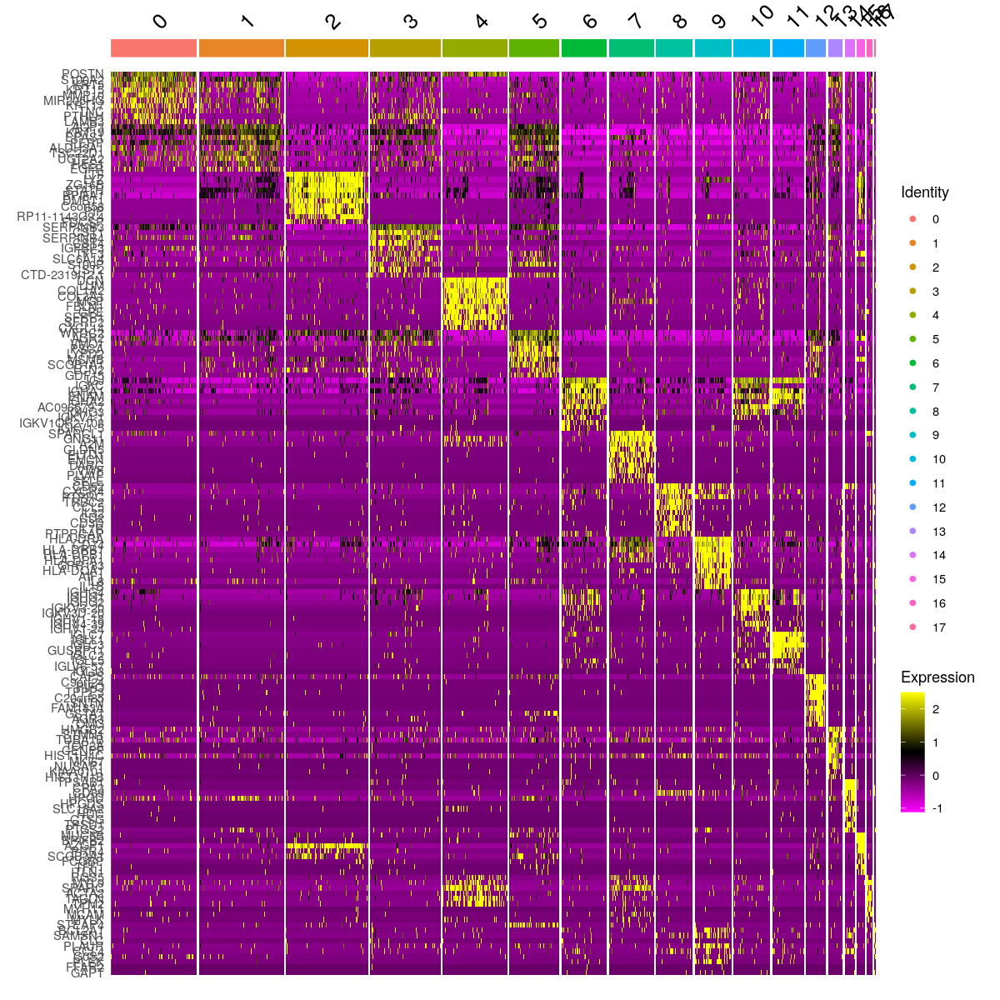

In [65]:
options(repr.plot.width=10, repr.plot.height=10)
DoHeatmap(object = ethSinus_seurat_obj, features = ethSinus_markers_top10$gene)

At this point we have a list of markers for each formed clusters but looking at these plots it's indeed clear that 18 are too many clusters and should be reduced. Most probably the number of cluters to be found are 10 - the number of cell types identified in the paper. A shown in these plots I can clearly see that there are marker genes that appear in many clusters, so these clusters should be merged into one.
As I was already mentioning, I couldn't manage to reproduce the clustering as in the paper,so I will keep them as they are becuase I want to focus my function analysis on a cluster well ddefined, cluster 2, and check the gene exrepssion enrichment since it is specific for non-polyp category.

# Preparing data for functional analysis

To be able to proceede with the functional analysis, I need the ranked list and I will first take all the markers and save them in different files and then I will move to file EthSinusFunctionalAnalysis for functional analysis.

On the functional analysis I will focus on clusters 0, 1 and 2. Clusters 0 and 1 is identified with basal cell type and they are divided in 0 as for polyp category and 1 as for non-polyp. Cluster 2 it mostly defining the non-polyp category and is identified as glandular cell type. I will start by contrasting clusters 0 and 1 to check if these two clusters have different marker genes.

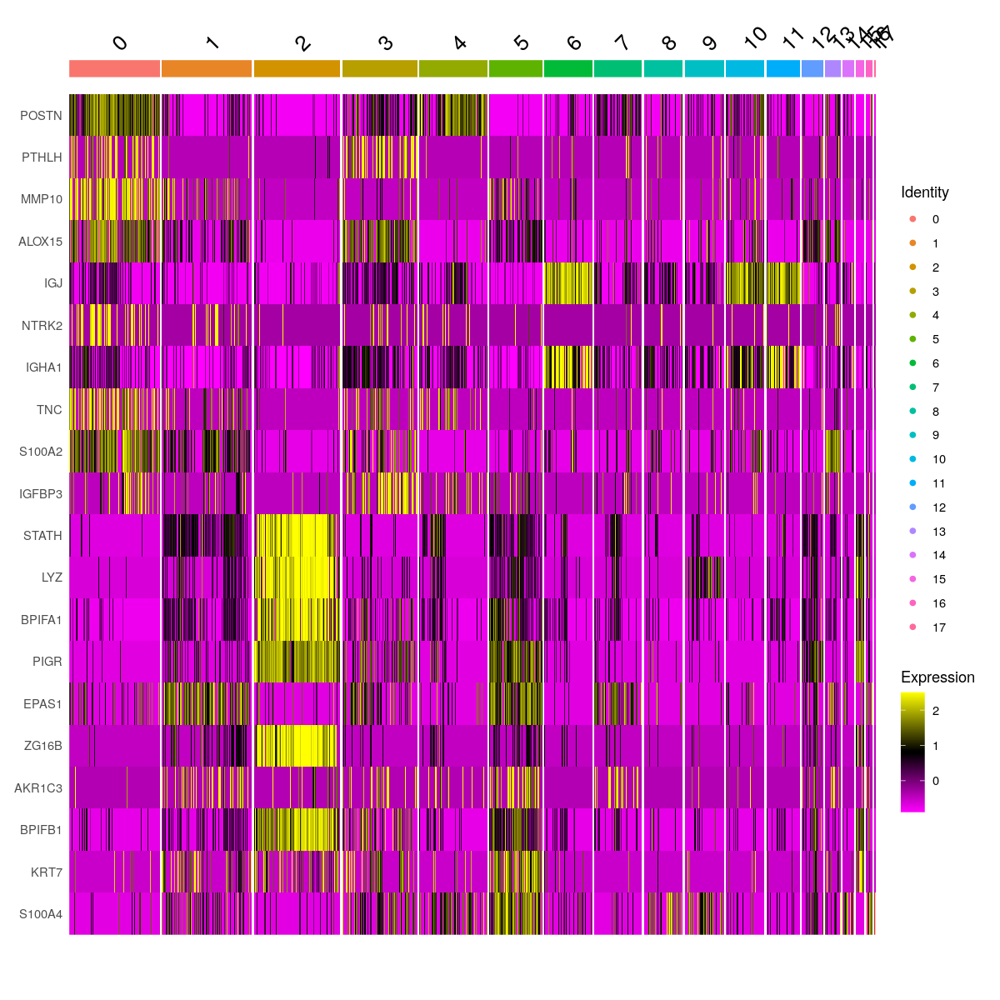

In [79]:
ethSinus_markers_cl1 <- FindMarkers(ethSinus_seurat_obj, ident.1 = 0, ident.2 = 1, 
                                 only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
ethSinus_markers_cl1 <- ethSinus_markers_cl1[order(ethSinus_markers_cl1$avg_logFC, decreasing = T),]

ethSinus_markers_cl2 <- FindMarkers(ethSinus_seurat_obj, ident.1 = 1, ident.2 = 0, 
                                 only.pos = TRUE, min.pct = 0.25, logfc.threshold = 0.25)
ethSinus_markers_cl2 <- ethSinus_markers_cl2[order(ethSinus_markers_cl2$avg_logFC, decreasing = T),]
top_markers_cl1_cl2 <- c(rownames(ethSinus_markers_cl1)[1:10], rownames(ethSinus_markers_cl2)[1:10])
DoHeatmap(object = ethSinus_seurat_obj, features = top_markers_cl1_cl2)

It looks like the two clusters are quite different based on marker genes and I will invatigate this further in the functional analysis.

In [84]:
#this step takes a bit of time to finish, the important information is stored in text files, for each cluster
ethSinus_markers_cluster_0 <- FindMarkers(ethSinus_seurat_obj, ident.1 = 0, ident.2 = 1,
                                         only.pos = F, 
                                         min.pct = 0, 
                                         logfc.threshold = 0, 
                                         return.thresh = 1)
ethSinus_markers_cluster_1 <- FindMarkers(ethSinus_seurat_obj, ident.1 = 1, ident.2 = 2,
                                         only.pos = F, 
                                         min.pct = 0, 
                                         logfc.threshold = 0, 
                                         return.thresh = 1)
ethSinus_markers_cluster_2 <- FindMarkers(ethSinus_seurat_obj, ident.1 = 2, ident.2 = 3,
                                         only.pos = F, 
                                         min.pct = 0, 
                                         logfc.threshold = 0, 
                                         return.thresh = 1)

In [85]:
write.table(ethSinus_markers_cluster_0, file = "ethSinus_markers_cluster_0.txt", sep = "\t", quote = F, col.names = F)
write.table(ethSinus_markers_cluster_1, file = "ethSinus_markers_cluster_1.txt", sep = "\t", quote = F, col.names = F)
write.table(ethSinus_markers_cluster_2, file = "ethSinus_markers_cluster_2.txt", sep = "\t", quote = F, col.names = F)


In [86]:
saveRDS(ethSinus_seurat_obj, file = "ethSinus_seurat_obj.rds.gz", compress = "gzip")